In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [3]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b',
                 'L6a': '#ffc0cb',
                 'L6b': '#fa9284'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/spatial_libd_human/')
file_list

['151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676',
 'load.sh']

In [5]:
file = '151675'

In [6]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/spatial_LIBD.tsv', index_col=0, sep='\t', header=None, names=['sample_id', 'label'])
ann = ann[ann.sample_id == int(file)]
ann.head()

,sample_id,label
AAACAACGAATAGTTC-1,151675,L1
AAACAAGTATCTCCCA-1,151675,L3
AAACACCAATAACTGC-1,151675,WM
AAACAGAGCGACTCCT-1,151675,L3
AAACAGGGTCTATATT-1,151675,L5


In [7]:
# каунты секвенирования
adata = sc.read_visium('../data/raw_spatial_data/spatial_libd_human/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\data\raw_spatial_data\spatial_libd_human\151675\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [8]:
adata.obs.label.notna().value_counts()

True     3566
False      26
Name: label, dtype: int64

In [10]:
adata.obs.label.value_counts()

L3    771
L5    732
WM    652
L6    533
L1    328
L2    275
L4    275
Name: label, dtype: int64

# adata

## Посчитаем метрики

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

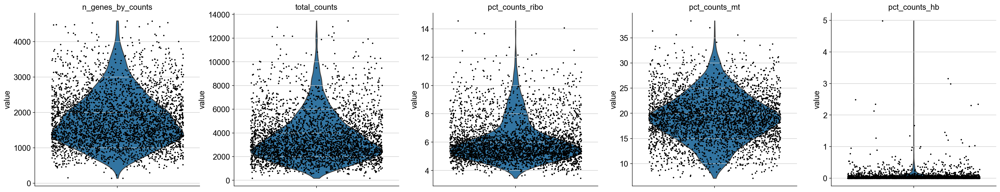

In [12]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

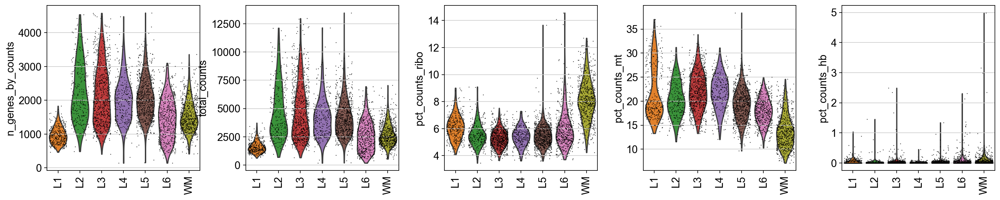

In [13]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1` и `L6` слоёв. А так же Число процент митохондриальных генов завышен в `L1` слое. Поэтому хотелось бы быть с ними аккуратнее

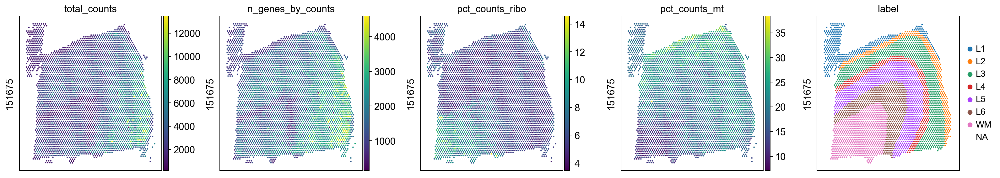

In [14]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

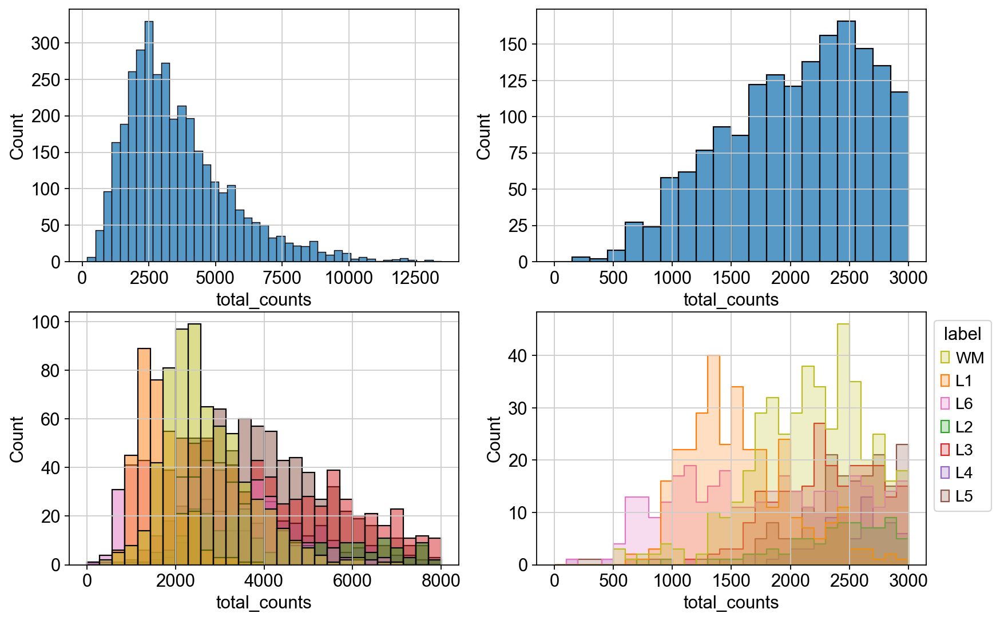

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 8000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, element='step')
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [16]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts')

median = 3139.5, [-1452.281982421875, 7731.281982421875]


Выберем порог по `total_counts = 700`

In [20]:
adata.obs['qc_lib_size'] = (((adata.obs['total_counts'] > 600) & (adata.obs['total_counts'] < 12000))).astype('string')
#adata.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = adata.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=23

label
L6    7
L3    6
L4    3
L5    3
WM    3
L2    1
Name: label, dtype: int64


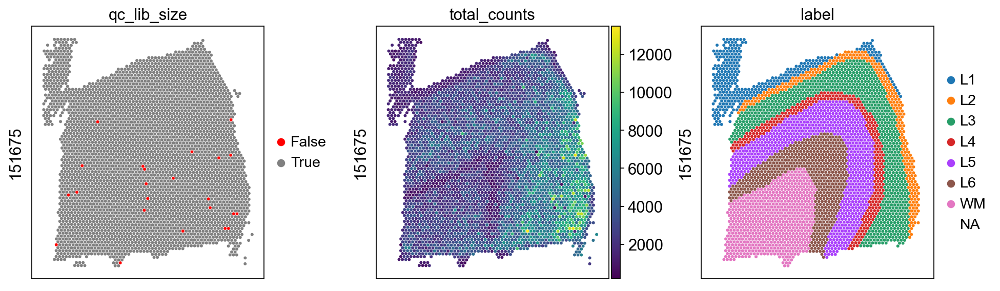

In [21]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

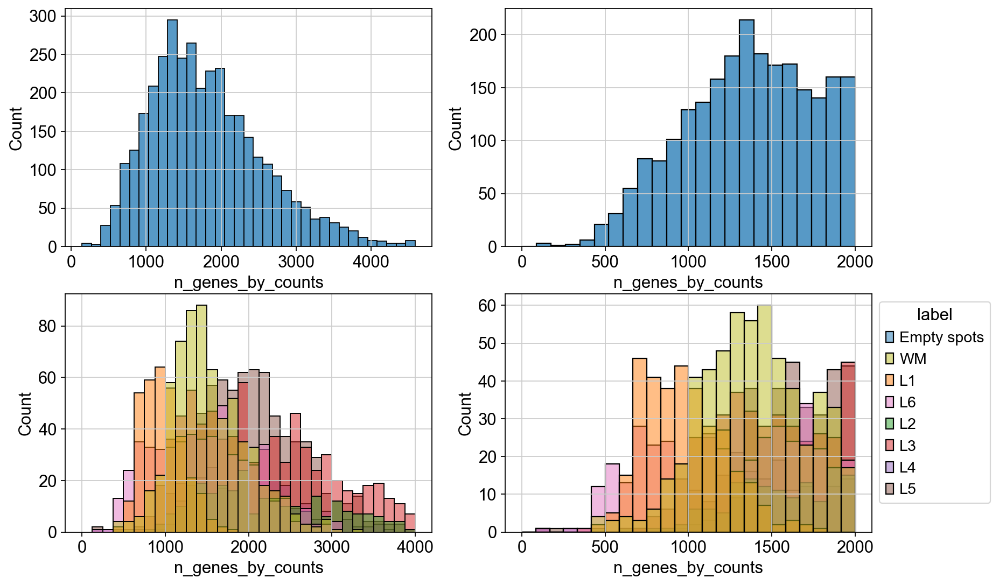

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 2000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `n_genes_by_counts = 600`

In [27]:
adata.obs['qc_n_genes'] = (((adata.obs['n_genes_by_counts'] > 500))).astype('string')
#adata.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = adata.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=27

label
L6    15
WM     4
L1     2
L4     2
L5     2
L2     1
L3     1
Name: label, dtype: int64


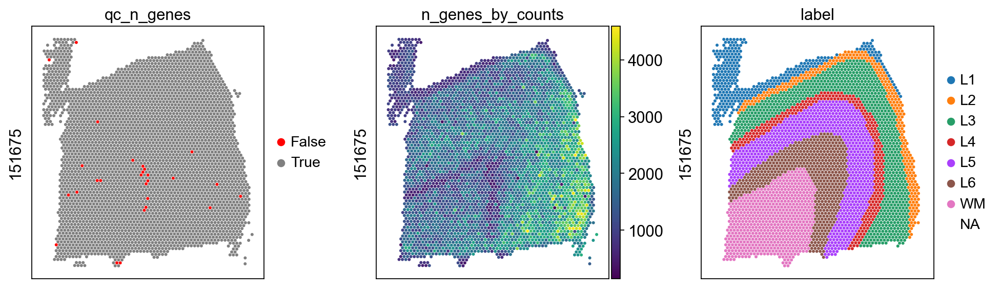

In [28]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

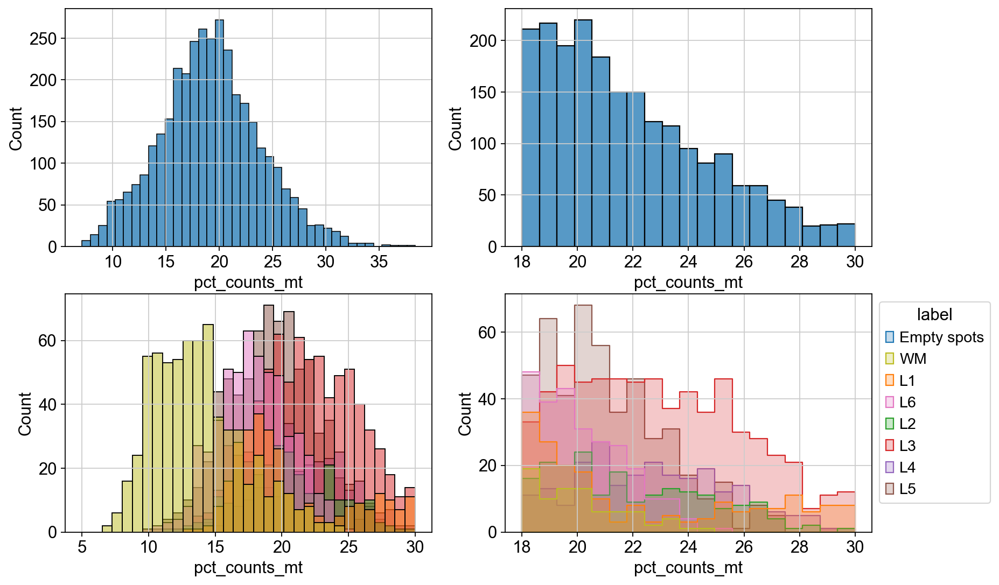

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[5, 30], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[18, 30], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_mt', binrange=[18, 30], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

В целом всё неплохо. Чтобы отфильтровать по митохондриям посчитаем 3MAD

Выберем порог по `pct_counts_mt = 23`

In [30]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_mt')

median = 19.054515838623047, [7.962235450744629, 30.146796226501465]


In [33]:
adata.obs['qc_mt'] = ((adata.obs['pct_counts_mt'] <= 25.5)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=336

label
L3    152
L1     96
L4     42
L2     28
L5     18
Name: label, dtype: int64


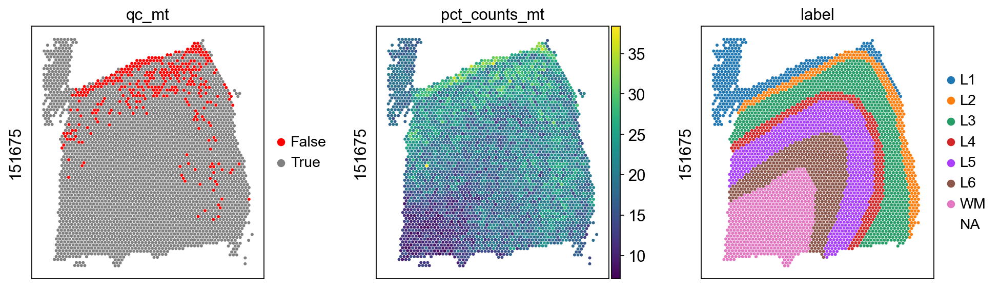

In [34]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_mt', 'pct_counts_mt', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

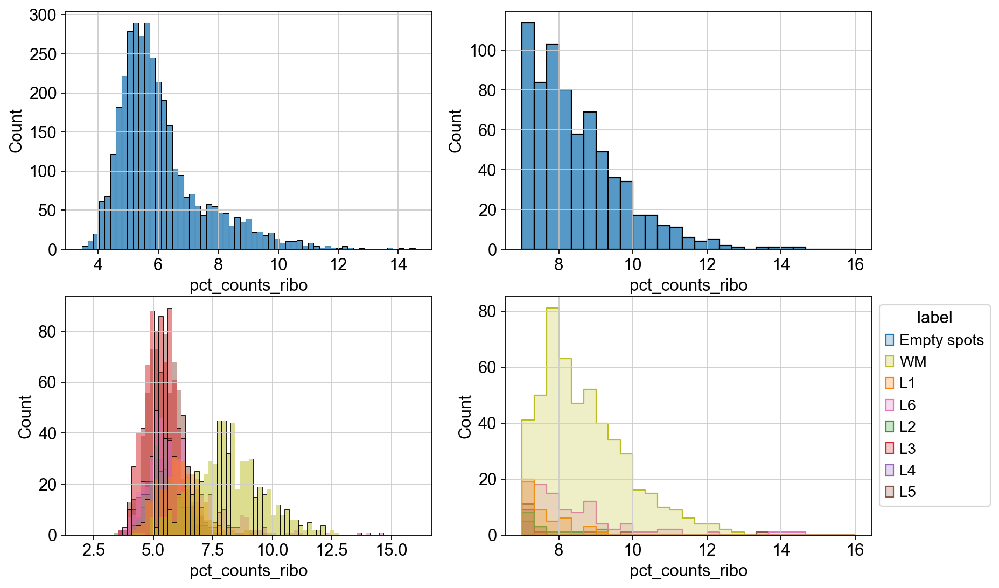

In [35]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[2, 16], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[7, 16], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD

In [36]:
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'pct_counts_ribo')

median = 5.697612762451172, [2.4437745809555054, 8.951450943946838]


Выберем порог `pct_counts_ribo = 12`

In [39]:
adata.obs['qc_ribo'] = ((adata.obs['pct_counts_ribo'] < 12)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=12

label
WM    7
L6    4
L5    1
Name: label, dtype: int64


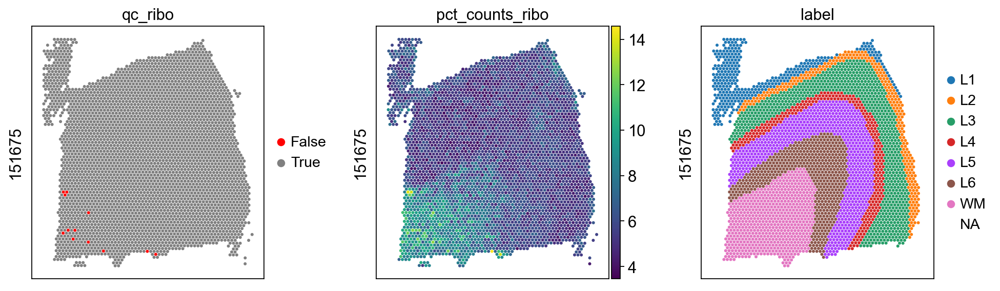

In [40]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

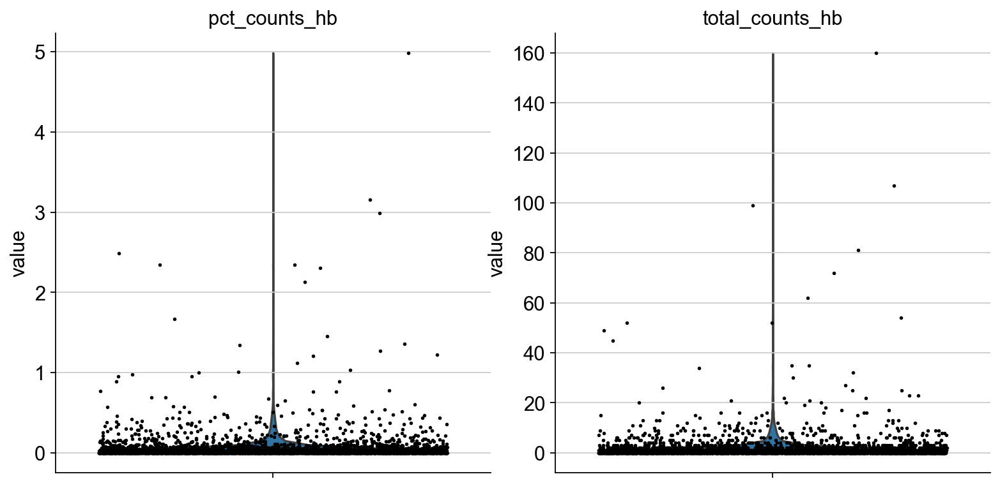

In [41]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Посчитаем 3MAD

In [42]:
median_pct, left_3mad_pct, right_3mad_pct = compute_3mad_intervals(adata.obs, 'pct_counts_hb')
median, left_3mad, right_3mad = compute_3mad_intervals(adata.obs, 'total_counts_hb')

median = 0.0, [-0.19228282570838928, 0.19228282570838928]
median = 0.0, [-5.30932080745697, 5.30932080745697]


In [43]:
adata.obs['qc_hb'] = ((adata.obs['pct_counts_hb'] <= 2) &
                      (adata.obs['total_counts_hb'] <= 40)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = adata.obs.groupby('qc_hb')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_hb'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=13

label
WM    5
L3    4
L6    2
L2    1
L5    1
Name: label, dtype: int64


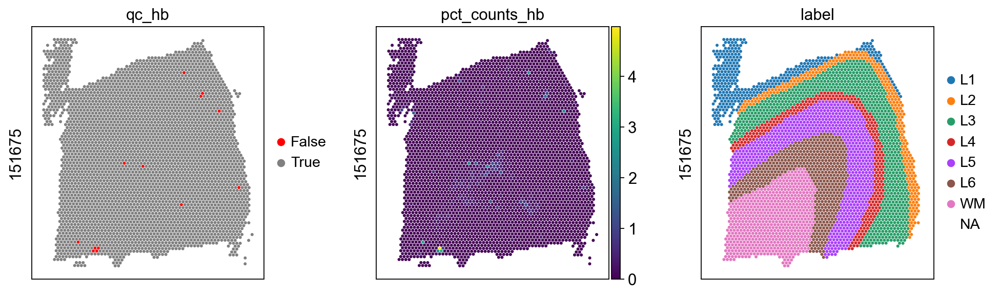

In [44]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [45]:
d = {'True': True, 'False': False}
adata.obs['qc_lib_size'] = adata.obs['qc_lib_size'].astype(object).replace(d)
adata.obs['qc_n_genes'] = adata.obs['qc_n_genes'].astype(object).replace(d)
adata.obs['qc_mt'] = adata.obs['qc_mt'].astype(object).replace(d)
adata.obs['qc_ribo'] = adata.obs['qc_ribo'].astype(object).replace(d)
adata.obs['qc_hb'] = adata.obs['qc_hb'].astype(object).replace(d)

In [46]:
adata.obs['qc_good_spots'] = (adata.obs.qc_lib_size * adata.obs.qc_n_genes *
                              adata.obs.qc_mt * adata.obs.qc_ribo * adata.obs.qc_hb).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=391

label
L3    160
L1     98
L4     44
L2     31
L5     22
L6     20
WM     16
Name: label, dtype: int64


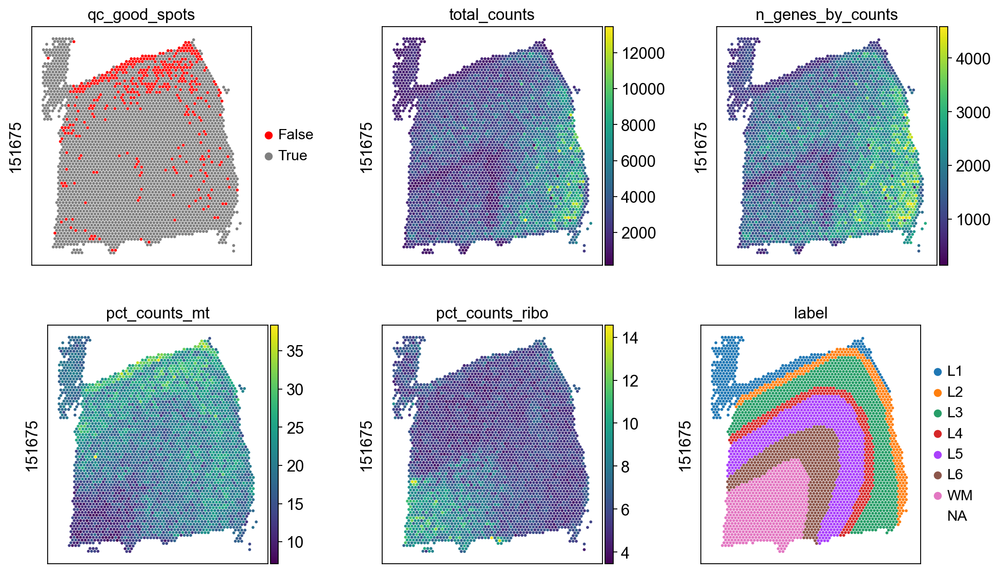

In [47]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

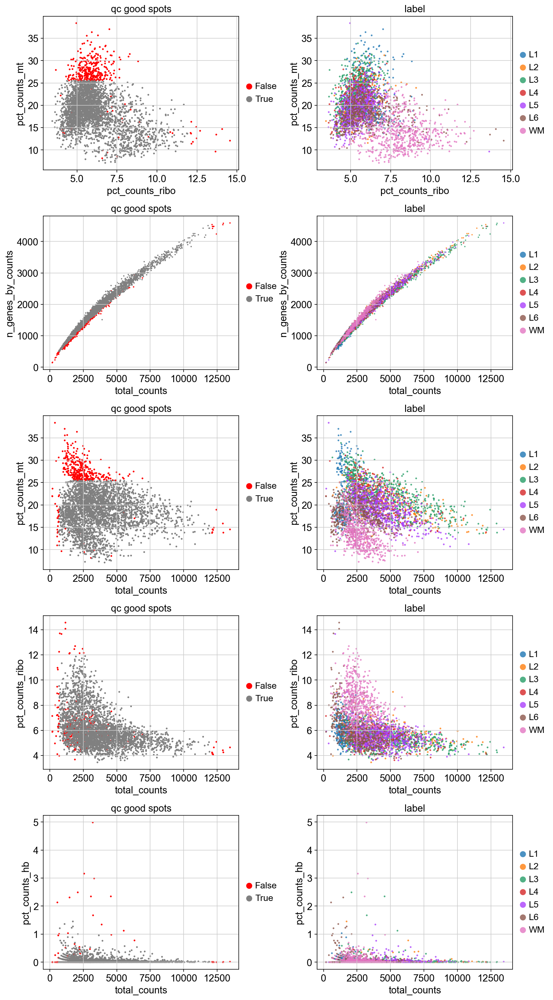

In [48]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)

plt.show()

### Cохраним отфильтрованые споты (без пустых)

In [49]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') & (adata.obs.label != 'Empty spots')].index

In [50]:
adata_filtered = adata[good_spots].copy()

### PCA

In [51]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:20)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


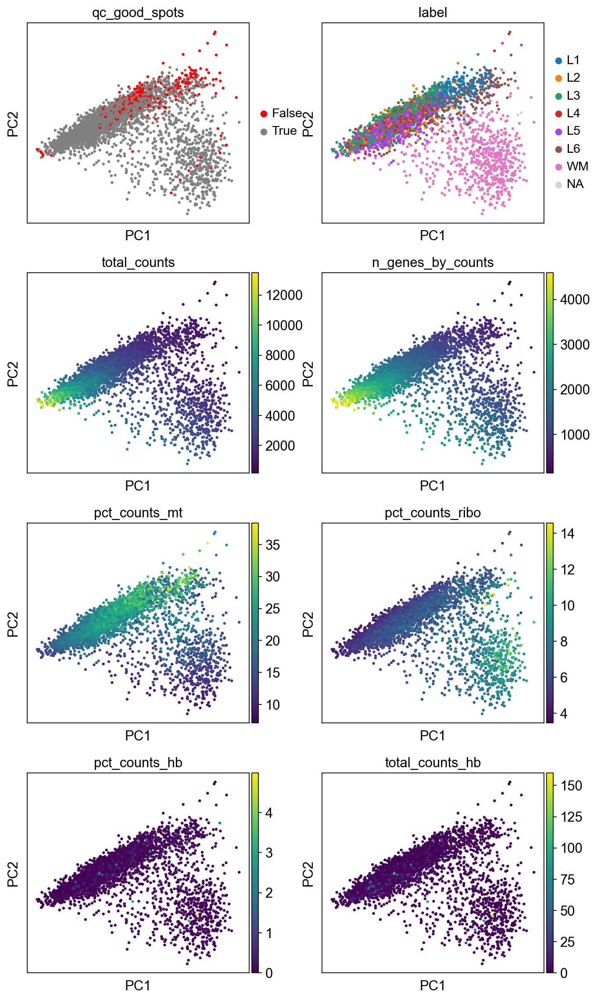

In [52]:
sc.pl.pca(adata, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=2, show=True)

## Сохраним в .h5ad

In [53]:
adata_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_good_spots', 'qc_mt', 'qc_hb', 'qc_ribo'], axis=1, inplace=True)

In [54]:
adata_filtered.obs.head()

,in_tissue,array_row,array_col,label,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAACGAATAGTTC-1,1,0,16,L1,151675,791,1163.0,201.0,17.282890,2.0,0.171969,68.0,5.846948
AAACAAGTATCTCCCA-1,1,50,102,L3,151675,3409,8257.0,1542.0,18.675064,0.0,0.000000,366.0,4.432602
AAACACCAATAACTGC-1,1,59,19,WM,151675,1791,3289.0,404.0,12.283369,0.0,0.000000,309.0,9.394953
AAACAGAGCGACTCCT-1,1,14,94,L3,151675,2681,5689.0,1000.0,17.577782,1.0,0.017578,261.0,4.587801
AAACAGGGTCTATATT-1,1,47,13,L5,151675,1341,2486.0,602.0,24.215607,1.0,0.040225,164.0,6.596943


In [55]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/libd', exist_ok=True)
adata_filtered.write_h5ad(f'../results/filtered_samples/libd/{file}.h5ad')